In [23]:
"""
Complete graph K₁₇ – A2 poster, 600 DPI
Colors: black background, pink edges, blue nodes
"""

import networkx as nx
import matplotlib.pyplot as plt
from pathlib import Path

# ── 1. Poster settings ────────────────────────────────────────────────
DPI        = 600           # print-quality resolution
WIDTH_IN   = 16.5          # A2 portrait 16.5 × 23.4 in
HEIGHT_IN  = 23.4
OUTDIR     = Path("k17_output_dark")
OUTDIR.mkdir(exist_ok=True)

# ── 2. Build complete graph K17 ───────────────────────────────────────
G   = nx.complete_graph(17)
pos = nx.circular_layout(G)       # symmetric circular placement

# ── 3. Plot ───────────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(WIDTH_IN, HEIGHT_IN), dpi=DPI,
                        facecolor="black")         # figure bg
ax.set_facecolor("black")                          # axes bg
ax.set_aspect("equal")
ax.axis("off")

# Draw edges (hot-pink lines)
nx.draw_networkx_edges(
    G, pos, ax=ax,
    width=0.5,
    edge_color="#ADB5BD"        # bright pink
)

# Draw nodes (blue fill, no edge)
nx.draw_networkx_nodes(
    G, pos, ax=ax,
    node_size=320,
    node_color="#ADB5BD",       # vivid blue
    edgecolors="none"
)

# Optional: labels (white text)
# nx.draw_networkx_labels(G, pos, ax=ax, font_size=8, font_color="white")

# ── 4. Save poster files ──────────────────────────────────────────────
fig.savefig(
    OUTDIR / "k17_graph_A2_600dpi_dark.png",
    dpi=DPI, bbox_inches="tight", pad_inches=0
)
fig.savefig(
    OUTDIR / "k17_graph_A2_vector_dark.pdf",
    format="pdf", bbox_inches="tight", pad_inches=0
)

print("✅ Files saved to:", OUTDIR.resolve())


✅ Files saved to: /Users/camiloariasabad/Desktop/Teaching/Older/Topics_Algorithms_2023/Notebooks_for_Topics_on_Algorithms/k17_output_dark


In [22]:
"""
E₈ root system – 2-D projection poster
--------------------------------------
• Generates 240 roots in R⁸, projects to 2-D via PCA, and plots.
• Saves:  e8_roots_A2_600dpi.png  (4961 × 7016 px)
          e8_roots_A2_vector.pdf  (vector, infinite resolution)
Requires: numpy, matplotlib, scikit-learn (or use the NumPy PCA fallback).
"""

import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

# ── 1. Poster parameters ───────────────────────────────────────────────
DPI        = 600
WIDTH_IN   = 16.5        # A2 portrait 16.5 × 23.4 in
HEIGHT_IN  = 23.4
OUTDIR     = Path("e8_output")
OUTDIR.mkdir(exist_ok=True)

# ── 2. Construct the 240 E₈ roots in R⁸ ────────────────────────────────
# Type A: all permutations of (±1, ±1, 0,0,0,0,0,0)  – 112 roots
roots = []
for i in range(8):
    for j in range(i + 1, 8):
        for signs in [(+1, +1), (+1, -1), (-1, +1), (-1, -1)]:
            v = np.zeros(8)
            v[i], v[j] = signs
            roots.append(v)

# Type B: all even-sum permutations of (±½, …, ±½)   – 128 roots
for bits in range(256):
    coords = np.array([+0.5 if (bits >> k) & 1 else -0.5 for k in range(8)])
    if int(coords.sum() * 2) % 2 == 0:   # even number of +½’s
        roots.append(coords)

roots = np.array(roots)                 # shape (240, 8)

# ── 3. PCA -- pick two orthogonal directions with largest variance ────
# If scikit-learn is available:
try:
    from sklearn.decomposition import PCA
    proj = PCA(n_components=2).fit_transform(roots)
except ImportError:
    # NumPy SVD fallback
    roots_centered = roots - roots.mean(axis=0)
    U, S, Vt = np.linalg.svd(roots_centered, full_matrices=False)
    proj = roots_centered @ Vt[:2].T      # (240, 2)

# Normalise for prettier radius (optional)
proj /= np.max(np.linalg.norm(proj, axis=1))

# ── 4. Plotting ────────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(WIDTH_IN, HEIGHT_IN), dpi=DPI)
ax.set_aspect("equal")
ax.axis("off")

ax.scatter(proj[:, 0], proj[:, 1],
           s=12,             # marker size (adjust to taste)
           linewidths=0,
           color="#2196f3")  # blue points

# ── 5. Save poster files ───────────────────────────────────────────────
fig.savefig(OUTDIR / "e8_roots_A2_600dpi.png",
            dpi=DPI, bbox_inches="tight", pad_inches=0)

fig.savefig(OUTDIR / "e8_roots_A2_vector.pdf",
            format="pdf", bbox_inches="tight", pad_inches=0)

print("✅ Files saved to:", OUTDIR.resolve())


✅ Files saved to: /Users/camiloariasabad/Desktop/Teaching/Older/Topics_Algorithms_2023/Notebooks_for_Topics_on_Algorithms/e8_output


Hasse diagram saved in tamari_out/tamari_n6.png/pdf


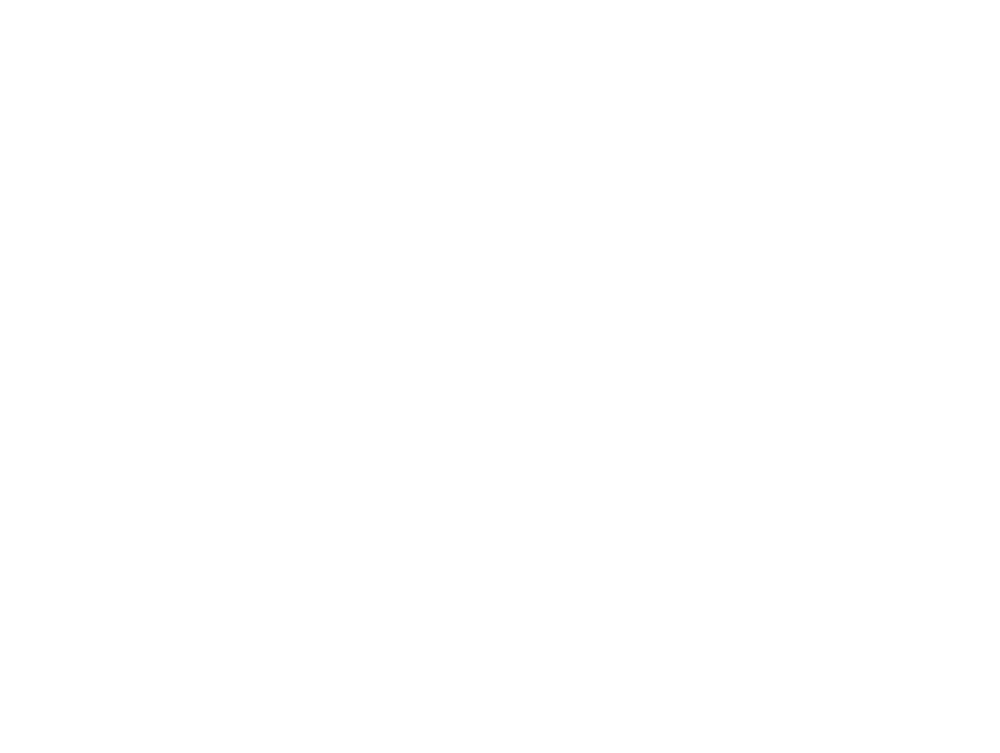

In [26]:
"""
Tamari lattice / associahedron Hasse diagram
--------------------------------------------
Visualise for n ≤ 6 comfortably (Catalan grows fast).
"""

import itertools, networkx as nx, matplotlib.pyplot as plt
from pathlib import Path
from functools import lru_cache

# ---------- 1. Binary-tree model ---------------------------------------
class Node:
    __slots__ = ("left", "right")
    def __init__(self, left=None, right=None):
        self.left, self.right = left, right
    def is_leaf(self): return self.left is self.right is None
    def to_tuple(self):          # immutable encoding
        return None if self.is_leaf() else (self.left.to_tuple(),
                                            self.right.to_tuple())

@lru_cache(maxsize=None)
def catalan_trees(n):
    "All plane binary trees with n internal nodes."
    if n == 0:
        yield Node()             # single leaf
    else:
        for k in range(n):
            for L in catalan_trees(k):
                for R in catalan_trees(n - 1 - k):
                    yield Node(L, R)

# ---------- 2. Right rotation cover relation ---------------------------
def covers(u: Node):
    "Neighbours obtained by ONE right rotation."
    result = []
    def dfs(node, replace):
        if node.is_leaf(): return
        # pattern:  (A • (B • C))  →  ((A • B) • C)
        A, BC = node.left, node.right
        if BC and not BC.is_leaf():
            B, C = BC.left, BC.right
            new = Node(Node(A, B), C)
            result.append(replace(new))
        # recurse
        dfs(node.left, lambda newL: replace(Node(newL, node.right)))
        dfs(node.right, lambda newR: replace(Node(node.left, newR)))
    dfs(u, lambda x: x)
    return result

# ---------- 3. Build lattice -------------------------------------------
def tamari_lattice(n: int):
    nodes = [t.to_tuple() for t in catalan_trees(n)]
    idx = {t: i for i, t in enumerate(nodes)}
    G = nx.DiGraph()
    G.add_nodes_from(range(len(nodes)))
    for t in catalan_trees(n):
        i = idx[t.to_tuple()]
        for v in covers(t):
            j = idx[v.to_tuple()]
            G.add_edge(i, j)      # upward edge
    return G

# ---------- 4. Draw & save ---------------------------------------------
def draw_tamari(n, dpi=300, outdir="tamari_out"):
    G = tamari_lattice(n)
    pos = nx.nx_agraph.graphviz_layout(G, prog="dot")  # layered layout

    plt.figure(figsize=(8, 6), dpi=dpi, facecolor="white")
    nx.draw_networkx_edges(G, pos, arrows=False, width=0.6)
    nx.draw_networkx_nodes(G, pos, node_size=100, node_color="#2196f3",
                           edgecolors="black", linewidths=0.4)
    plt.axis("off")

    Path(outdir).mkdir(exist_ok=True)
    plt.savefig(f"{outdir}/tamari_n{n}.png", bbox_inches="tight", pad_inches=0)
    plt.savefig(f"{outdir}/tamari_n{n}.pdf", format="pdf",
                bbox_inches="tight", pad_inches=0)
    print(f"Hasse diagram saved in {outdir}/tamari_n{n}.png/pdf")

draw_tamari(6)


In [27]:
json_path="/Users/camiloariasabad/Desktop/Teaching/Older/Topics_Algorithms_2023/Notebooks_for_Topics_on_Algorithms/colombia_municipios_coords.json"

In [31]:
import json, pandas as pd

with open("colombia_municipios_coords.json", "r", encoding="utf-8") as f:
    municipios = json.load(f)

df = pd.DataFrame(municipios)
print(df.head())

    name        lon        lat
0  mun_0 -57.074772  49.872668
1  mun_1 -58.198393  49.507412
2  mun_2 -58.074807  49.232631
3  mun_3 -58.831408  49.247555
4  mun_4 -59.711581  49.152182


Loaded 1155 municipalities
Graph: 1155 nodes, 666435 edges
MST edges: 1154


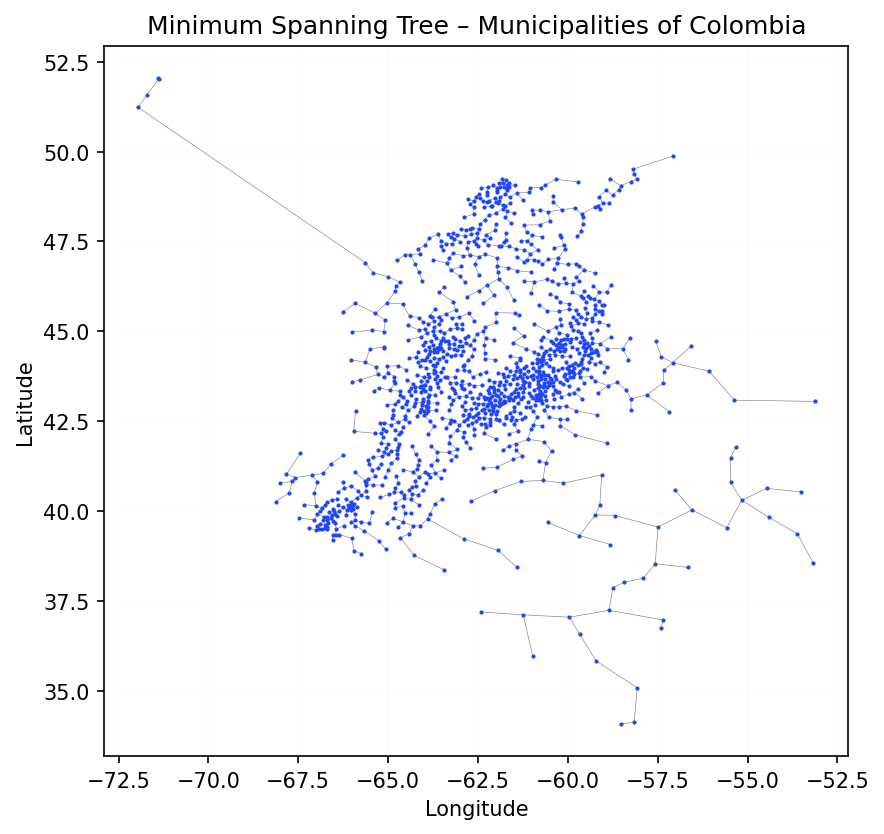

In [40]:
"""
MST of Colombian Municipalities
--------------------------------
• Reads a JSON list of {name, lon, lat}.
• Builds the complete graph (all pairs) with great-circle distance weights.
• Computes the Minimum Spanning Tree (MST).
• Plots the centroids and the MST edges with Matplotlib.
Requires: pandas, networkx, matplotlib, numpy.
"""

import json
from pathlib import Path
from itertools import combinations
from math import radians, sin, cos, sqrt, atan2

import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt


# ── 1.  Load centroid data ──────────────────────────────────────────────
json_path = Path("colombia_municipios_coords.json")   # adjust if needed
with open(json_path, encoding="utf-8") as f:
    data = json.load(f)

df = pd.DataFrame(data)           # columns: name, lon, lat
print(f"Loaded {len(df)} municipalities")

# ── 2.  Haversine distance (km) ─────────────────────────────────────────
R_EARTH = 6371.0  # km

def haversine(lon1, lat1, lon2, lat2):
    lon1, lat1, lon2, lat2 = map(radians, (lon1, lat1, lon2, lat2))
    dlon, dlat = lon2 - lon1, lat2 - lat1
    a = sin(dlat / 2) ** 2 + cos(lat1) * cos(lat2) * sin(dlon / 2) ** 2
    return 2 * R_EARTH * atan2(sqrt(a), sqrt(1 - a))

# ── 3.  Build the complete weighted graph ──────────────────────────────
G = nx.Graph()
for idx, row in df.iterrows():
    G.add_node(idx, name=row["name"], lon=row["lon"], lat=row["lat"])

coords = df[["lon", "lat"]].to_numpy()
for i, j in combinations(range(len(df)), 2):
    lon1, lat1 = coords[i]
    lon2, lat2 = coords[j]
    G.add_edge(i, j, weight=haversine(lon1, lat1, lon2, lat2))

print(f"Graph: {G.number_of_nodes()} nodes, {G.number_of_edges()} edges")

# ── 4.  Minimum Spanning Tree ───────────────────────────────────────────
mst = nx.minimum_spanning_tree(G, weight="weight")
print(f"MST edges: {mst.number_of_edges()}")

# ── 5.  Plot ────────────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(6, 8), dpi=150)

# Draw municipal centroids
ax.scatter(df["lon"], df["lat"], s=1, color="#2146f3", zorder=2)

# Draw MST edges
for u, v in mst.edges():
    lon1, lat1 = coords[u]
    lon2, lat2 = coords[v]
    ax.plot([lon1, lon2], [lat1, lat2],
            color="black", linewidth=0.3, alpha=0.5, zorder=1)

ax.set_title("Minimum Spanning Tree – Municipalities of Colombia")
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.set_aspect("equal", adjustable="box")
ax.grid(ls="--", lw=0.1, alpha=0.2)
plt.tight_layout()
plt.show()


Remaining: 1122 nodes, 1459 edges


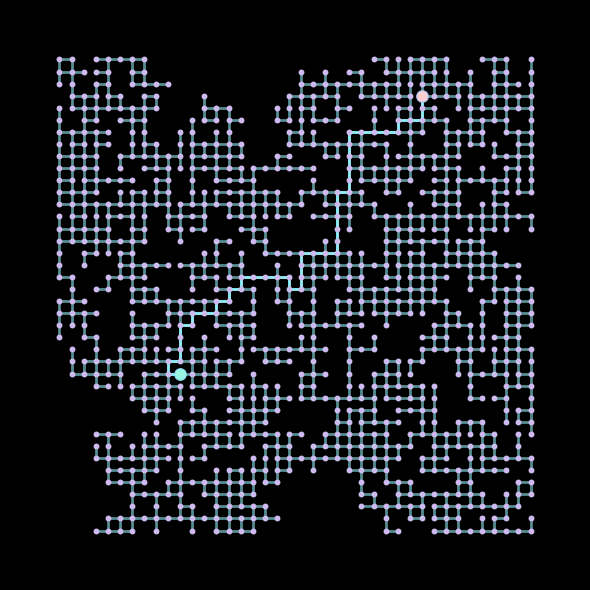

In [105]:
"""
Randomly pruned 40×40 grid – Pastel Tailwind palette
----------------------------------------------------
Colours (light → dark):
 Lemon chiffon  #fbf8cc   Champagne pink  #fde4cf   Tea-rose red   #ffcfd2
 Pink lavender  #f1c0e8   Mauve           #cfbaf0   Jordy blue     #a3c4f3
 Non-photo blue #90dbf4   Electric blue   #8eecf5   Aquamarine     #98f5e1
 Celadon        #b9fbc0
"""

import random
import networkx as nx
import matplotlib.pyplot as plt

# ── 1 · Parameters you can tweak ───────────────────────────────────────
GRID_W, GRID_H = 40, 40
P_REMOVE_NODE  = 0.20
P_REMOVE_EDGE  = 0.20
SEED           = random.choice(range(100))      # new instance each run
random.seed(SEED)

# ── 2 · Tailwind pastel palette (hex) ──────────────────────────────────
LEMON_CHIFFON  = "#fbf8cc"   # background
CHAMPAGNE_PINK = "#fde4cf"   # base edges
TEA_ROSE_RED   = "#ffcfd2"   # target node fill
PINK_LAVENDER  = "#f1c0e8"
MAUVE          = "#cfbaf0"   # base nodes
JORDY_BLUE     = "#a3c4f3"
NON_PHOTO_BLUE = "#90dbf4"   # source node border
ELECTRIC_BLUE  = "#8eecf5"   # highlighted path
AQUAMARINE     = "#98f5e1"   # source node fill
CELADON        = "#b9fbc0"

# ── 3 · Build & randomly prune the grid ───────────────────────────────
G = nx.grid_2d_graph(GRID_W, GRID_H)
for n in list(G.nodes):
    if random.random() < P_REMOVE_NODE:
        G.remove_node(n)
for e in list(G.edges):
    if random.random() < P_REMOVE_EDGE:
        G.remove_edge(*e)

# Keep the largest connected component
if not nx.is_connected(G):
    G = G.subgraph(max(nx.connected_components(G), key=len)).copy()

print(f"Remaining: {G.number_of_nodes()} nodes, {G.number_of_edges()} edges")

# ── 4 · Pick source/target and shortest path ──────────────────────────
source, target = random.sample(list(G.nodes), 2)
spath       = nx.shortest_path(G, source, target)
spath_edges = list(zip(spath, spath[1:]))

# ── 5 · Plot (and save as vector PDF) ─────────────────────────────────
pos = {n: n for n in G.nodes}            # (x, y) coordinates

fig, ax = plt.subplots(figsize=(6, 6), facecolor="black")

# Base edges & nodes
nx.draw_networkx_edges(G, pos, ax=ax, width=2, alpha=0.6,
                       edge_color=ELECTRIC_BLUE)
nx.draw_networkx_nodes(G, pos, ax=ax, node_size=18, node_color=MAUVE,
                       linewidths=0)

# Highlighted shortest path
nx.draw_networkx_edges(G, pos, ax=ax, edgelist=spath_edges,
                       width=2.0, edge_color=ELECTRIC_BLUE)

# Source & target markers
nx.draw_networkx_nodes(G, pos, ax=ax, nodelist=[source], node_size=70,
                       node_color=AQUAMARINE, edgecolors=NON_PHOTO_BLUE,
                       linewidths=0.8)
nx.draw_networkx_nodes(G, pos, ax=ax, nodelist=[target], node_size=70,
                       node_color=TEA_ROSE_RED, edgecolors=JORDY_BLUE,
                       linewidths=0.8)

ax.axis("off")
fig.tight_layout()

# Save as vector PDF (infinite resolution) and show
fig.savefig("grid_mst_palette.pdf", format="pdf", bbox_inches="tight")
plt.show()


Remaining: 687 nodes, 896 edges


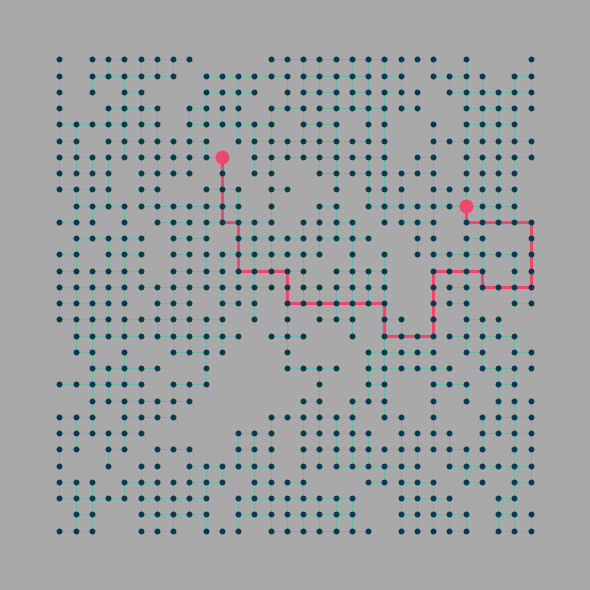

In [227]:
"""
Randomly pruned 40×40 grid – Cool-greens/blue Tailwind palette
--------------------------------------------------------------
Two chosen nodes *and* the shortest-path edges share the same highlight colour.
Palette swatch (light → dark):
#e9eded  #98acae  #c2f7ff  #0adeff  #015adf  #003b7a
#c2fff0  #1fffcb  #00cc9c  #007a5e
"""

import random
import networkx as nx
import matplotlib.pyplot as plt

# ── 1 · Parameters ────────────────────────────────────────────────────
GRID_W, GRID_H = 30, 30
P_REMOVE_NODE  = 0.20
P_REMOVE_EDGE  = 0.20
SEED           = random.choice(range(100))
random.seed(SEED)
PALETTE = {
    "Bright_Pink_Crayola": "#ef476f",
    "Sunglow":              "#ffd166",
    "Emerald":              "#06d6a0",
    "Blue_NCS":             "#118ab2",
    "Midnight_Green":       "#073b4c",
}


# ── 2 · Tailwind palette (hex) ────────────────────────────────────────
ANTI_FLASH     = PALETTE["Sunglow"]   # background
CADET_GRAY     = PALETTE["Emerald"]   # base edges
YALE_BLUE      = PALETTE["Midnight_Green"]   # base nodes
HIGHLIGHT      =PALETTE["Bright_Pink_Crayola"]  # colour for path *and* terminals

# ── 3 · Build & prune grid ────────────────────────────────────────────
G = nx.grid_2d_graph(GRID_W, GRID_H)
for n in list(G.nodes):
    if random.random() < P_REMOVE_NODE:
        G.remove_node(n)
for e in list(G.edges):
    if random.random() < P_REMOVE_EDGE:
        G.remove_edge(*e)

# Keep largest component
if not nx.is_connected(G):
    G = G.subgraph(max(nx.connected_components(G), key=len)).copy()

print(f"Remaining: {G.number_of_nodes()} nodes, {G.number_of_edges()} edges")

# ── 4 · Choose source, target, shortest path ──────────────────────────
src, tgt = random.sample(list(G.nodes), 2)
spath       = nx.shortest_path(G, src, tgt)
spath_edges = list(zip(spath, spath[1:]))

# ── 5 · Plot & save vector PDF (infinite resolution) ──────────────────
pos = {n: n for n in G.nodes}

fig, ax = plt.subplots(figsize=(6, 6), facecolor="darkgray")

# Base graph
nx.draw_networkx_edges(G, pos, ax=ax, width=0.4, alpha=0.6,
                       edge_color=CADET_GRAY)
nx.draw_networkx_nodes(G, pos, ax=ax, node_size=18,
                       node_color=YALE_BLUE, linewidths=0)

# Highlight (same colour for path + endpoints)
nx.draw_networkx_edges(G, pos, ax=ax, edgelist=spath_edges,
                       width=2.2, edge_color=HIGHLIGHT)
nx.draw_networkx_nodes(G, pos, ax=ax, nodelist=[src, tgt],
                       node_size=80, node_color=HIGHLIGHT,
                       edgecolors=HIGHLIGHT, linewidths=1.0)

ax.axis("off")
fig.tight_layout()

# Vector PDF — infinite resolution
fig.savefig("grid_path_highlight.pdf", format="pdf", bbox_inches="tight")
plt.show()



Remaining: 1255 nodes, 1614 edges
MST edges: 1254


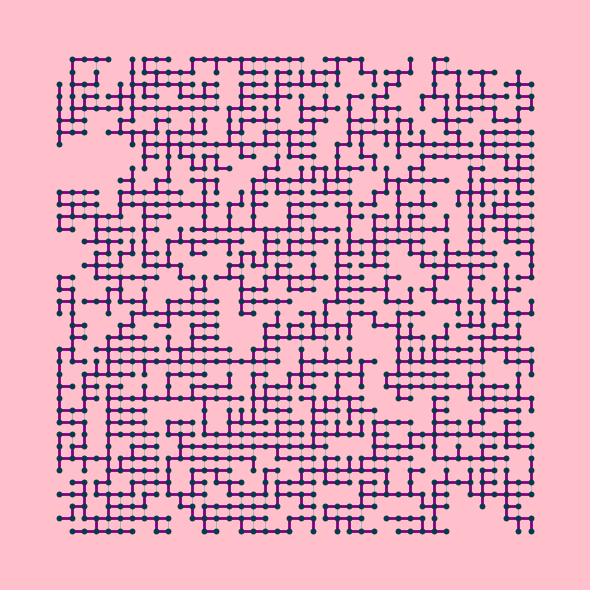

In [245]:
"""
Randomly pruned 40×40 grid – 5-colour palette + Minimum Spanning Tree
--------------------------------------------------------------------
Base graph uses cool blues/greens; the MST is highlighted in emerald.
"""

import random
import math
import networkx as nx
import matplotlib.pyplot as plt

# ── 1 · Parameters ────────────────────────────────────────────────────
GRID_W, GRID_H = 40, 40
P_REMOVE_NODE  = 0.20
P_REMOVE_EDGE  = 0.20
SEED           = random.choice(range(100))      # random instance each run
random.seed(SEED)

# ── 2 · Tailwind palette (default shades) ─────────────────────────────
PALETTE = {
    "Bright_Pink_Crayola": "#ef476f",
    "Sunglow":             "#ffd166",
    "Emerald":             "#06d6a0",   # MST highlight
    "Blue_NCS":            "#118ab2",   # base edges
    "Midnight_Green":      "#073b4c",   # base nodes
}
BACKGROUND = "pink"                   # plain white page

# ── 3 · Build & randomly prune the grid ───────────────────────────────
G = nx.grid_2d_graph(GRID_W, GRID_H)
for n in list(G.nodes):
    if random.random() < P_REMOVE_NODE:
        G.remove_node(n)
for e in list(G.edges):
    if random.random() < P_REMOVE_EDGE:
        G.remove_edge(*e)

# Keep largest connected component
if not nx.is_connected(G):
    G = G.subgraph(max(nx.connected_components(G), key=len)).copy()

print(f"Remaining: {G.number_of_nodes()} nodes, {G.number_of_edges()} edges")

# ── 4 · Add weights (Euclidean) and compute MST ───────────────────────
def dist(a, b):
    (x1, y1), (x2, y2) = a, b
    return math.hypot(x2 - x1, y2 - y1)

for u, v in G.edges():
    G[u][v]["weight"] = dist(u, v)

mst = nx.minimum_spanning_tree(G, weight="weight")
print(f"MST edges: {mst.number_of_edges()}")

# ── 5 · Plot & save as vector PDF ─────────────────────────────────────
pos = {n: n for n in G.nodes}

fig, ax = plt.subplots(figsize=(6, 6), facecolor=BACKGROUND)

# Base graph: edges & nodes
nx.draw_networkx_edges(G, pos, ax=ax, width=0.4, alpha=0.6,
                       edge_color=PALETTE["Blue_NCS"])
nx.draw_networkx_nodes(G, pos, ax=ax, node_size=18,
                       node_color=PALETTE["Midnight_Green"], linewidths=0)

# Highlight the MST
nx.draw_networkx_edges(mst, pos, ax=ax,
                       width=2.0, edge_color="purple")#PALETTE["Bright_Pink_Crayola"])

ax.axis("off")
fig.tight_layout()

# Vector PDF – infinite resolution
fig.savefig("grid_mst_highlight.pdf", format="pdf", bbox_inches="tight")
plt.show()


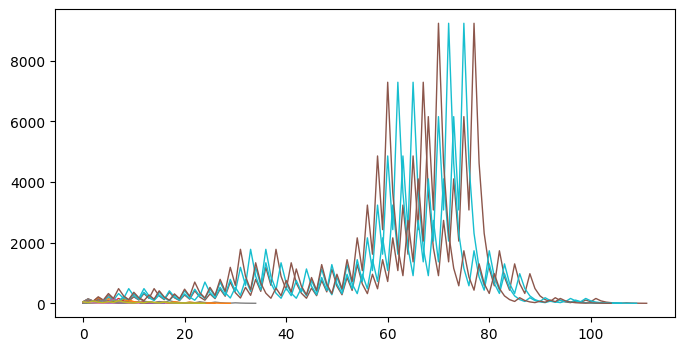

In [268]:
import matplotlib.pyplot as plt

def collatz(n):
    return 3*n + 1 if n % 2 else n // 2

def seq(n):
    s = [n]
    while n > 1:
        n = collatz(n)
        s.append(n)
    return s

N = 50                       # plot first 20 start values
plt.figure(figsize=(8, 4))
for n in range(2, N + 1):
    y = seq(n)
    plt.plot(range(len(y)), y, lw=1)

#plt.yscale("log")
#plt.xlabel("Step")
#plt.ylabel("Value (log scale)")
#plt.title("Collatz hailstone trajectories 2 … 20")
plt.show()

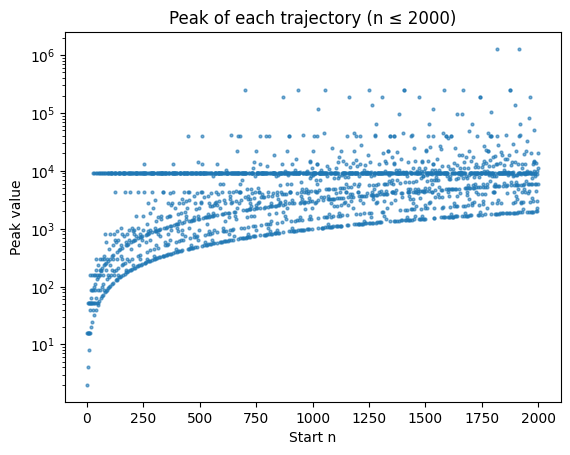

In [258]:
import numpy as np, matplotlib.pyplot as plt
values = np.arange(2, 2000)
peaks  = [max(seq(n)) for n in values]
plt.scatter(values, peaks, s=4, alpha=0.6)
plt.yscale("log")
plt.xlabel("Start n"); plt.ylabel("Peak value")
plt.title("Peak of each trajectory (n ≤ 2000)")
plt.show()


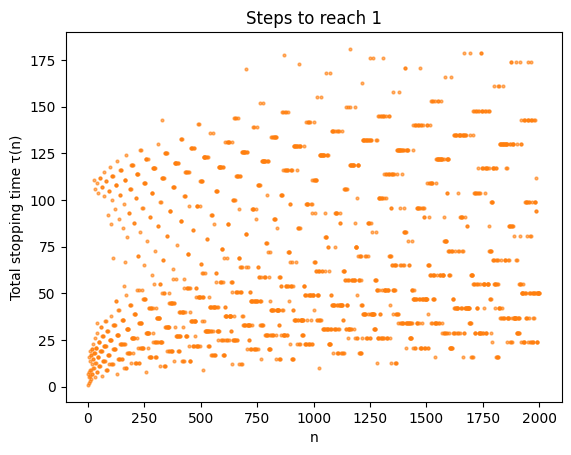

In [259]:
stops = [len(seq(n)) - 1 for n in values]
plt.scatter(values, stops, s=4, alpha=0.6, c="tab:orange")
plt.xlabel("n"); plt.ylabel("Total stopping time τ(n)")
plt.title("Steps to reach 1")
plt.show()

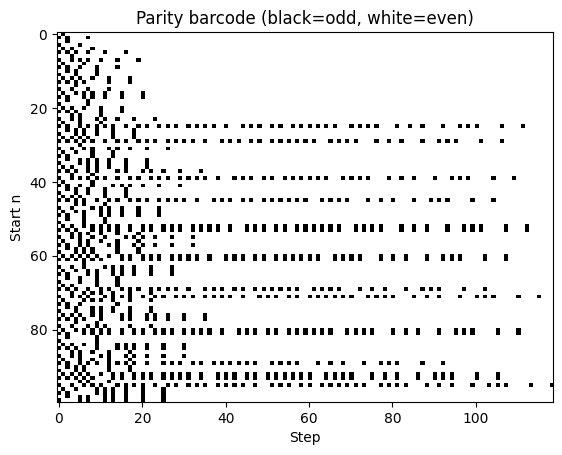

In [260]:
import numpy as np
rows = 100        # first 100 n
max_len = max(len(seq(n)) for n in range(2, rows+2))
bar = np.zeros((rows, max_len))
for i, n in enumerate(range(2, rows+2)):
    s = seq(n)
    bar[i, :len(s)] = [x % 2 for x in s]

plt.imshow(bar, cmap="Greys", aspect="auto")
plt.xlabel("Step"); plt.ylabel("Start n")
plt.title("Parity barcode (black=odd, white=even)")
plt.show()


In [263]:
import networkx as nx
N = 200
G = nx.DiGraph()
for n in range(2, N+1):
    m = collatz(n)
    if m <= N: G.add_edge(n, m)

pos = nx.spring_layout(G, dim=3)      # change to dim=2 for flat plot
# draw with mpl_toolkits.mplot3d or plotly for 3-D interactivity


In [265]:
import math

N  = 512
cols = int(math.sqrt(N))
rows = math.ceil(N / cols)
# pad with NaN so we can reshape safely
pad = rows*cols - N
τ_padded = np.append(τ, [np.nan]*pad)
grid = τ_padded.reshape(rows, cols)



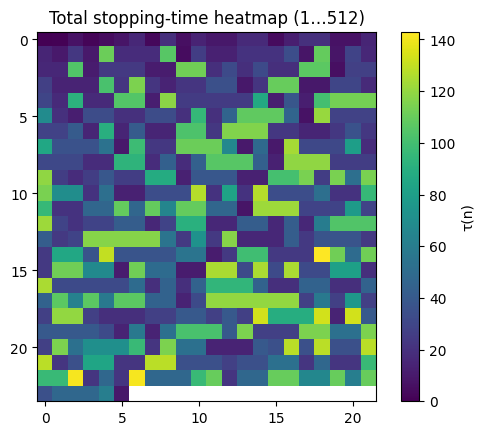

In [266]:
plt.imshow(grid, cmap="viridis")
plt.colorbar(label="τ(n)")
plt.title(f"Total stopping-time heatmap (1…{N})")
plt.show()


/var/folders/_l/7xr3qhx50rl1tsc0s6dt78hr0000gn/T/ipykernel_11270/2765007618.py:59: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


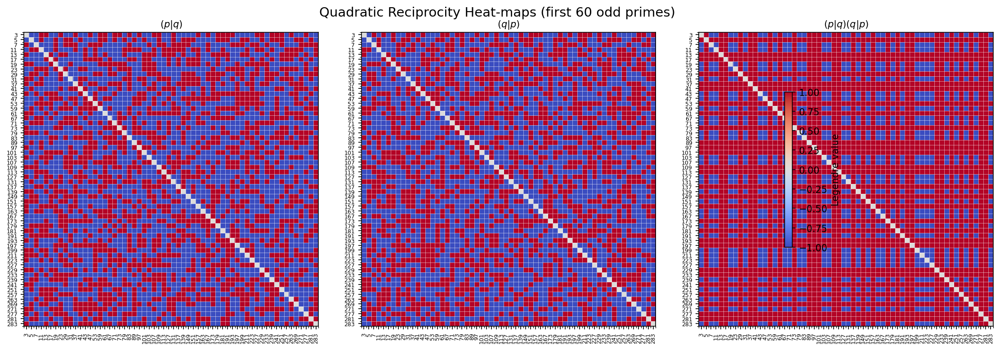

In [275]:
import numpy as np
import matplotlib.pyplot as plt
import math

# ── 1 · Minimal prime generator (sieve) ────────────────────────────────
def first_odd_primes(n):
    """Return the first n odd primes (2 excluded)."""
    # Rough upper bound using p_k ≈ k(log k + log log k)
    if n < 6:
        limit = 15
    else:
        limit = int(n * (math.log(n) + math.log(math.log(n)))) + 10
    sieve = bytearray(b"\x01") * (limit + 1)
    sieve[:2] = b"\x00\x00"
    for p in range(2, int(limit**0.5) + 1):
        if sieve[p]:
            sieve[p*p : limit+1 : p] = b"\x00" * len(range(p*p, limit+1, p))
    primes = [p for p in range(3, limit+1) if sieve[p] and p % 2]
    return primes[:n]

# ── 2 · Parameters ─────────────────────────────────────────────────────
NUM_PRIMES = 60                         # try 60, 80, 100 …
primes     = first_odd_primes(NUM_PRIMES)
n          = len(primes)

# ── 3 · Legendre symbol -------------------------------------------------
def legendre(a: int, p: int) -> int:
    a %= p
    if a == 0:
        return 0
    return 1 if pow(a, (p - 1) // 2, p) == 1 else -1

# build (p|q) matrix
mat_pq = np.fromfunction(
    np.vectorize(lambda i, j: 0 if primes[int(i)] == primes[int(j)]
                 else legendre(primes[int(i)], primes[int(j)])),
    (n, n), dtype=int
)
mat_qp   = mat_pq.T
mat_prod = mat_pq * mat_qp

# ── 4 · Plot ------------------------------------------------------------
fig, axes = plt.subplots(1, 3, figsize=(15, 5), dpi=150)
titles = [r"$(p|q)$", r"$(q|p)$", r"$(p|q)(q|p)$"]
mats   = [mat_pq, mat_qp, mat_prod]

for ax, M, title in zip(axes, mats, titles):
    im = ax.imshow(M, cmap="coolwarm", vmin=-1, vmax=1)
    ax.set_xticks(range(n)); ax.set_yticks(range(n))
    ax.set_xticklabels(primes, rotation=90, fontsize=6)
    ax.set_yticklabels(primes, fontsize=6)
    ax.set_title(title, fontsize=10)
    ax.set_xticks(np.arange(-.5, n, 1), minor=True)
    ax.set_yticks(np.arange(-.5, n, 1), minor=True)
    ax.grid(which="minor", color="white", lw=.25)

fig.colorbar(im, ax=axes.ravel().tolist(), shrink=.6, label="Legendre value")
fig.suptitle(f"Quadratic Reciprocity Heat-maps (first {n} odd primes)", fontsize=14)
plt.tight_layout()

# Optional: vector PDF
fig.savefig("quadratic_reciprocity_heatmaps.pdf", bbox_inches="tight")
plt.show()


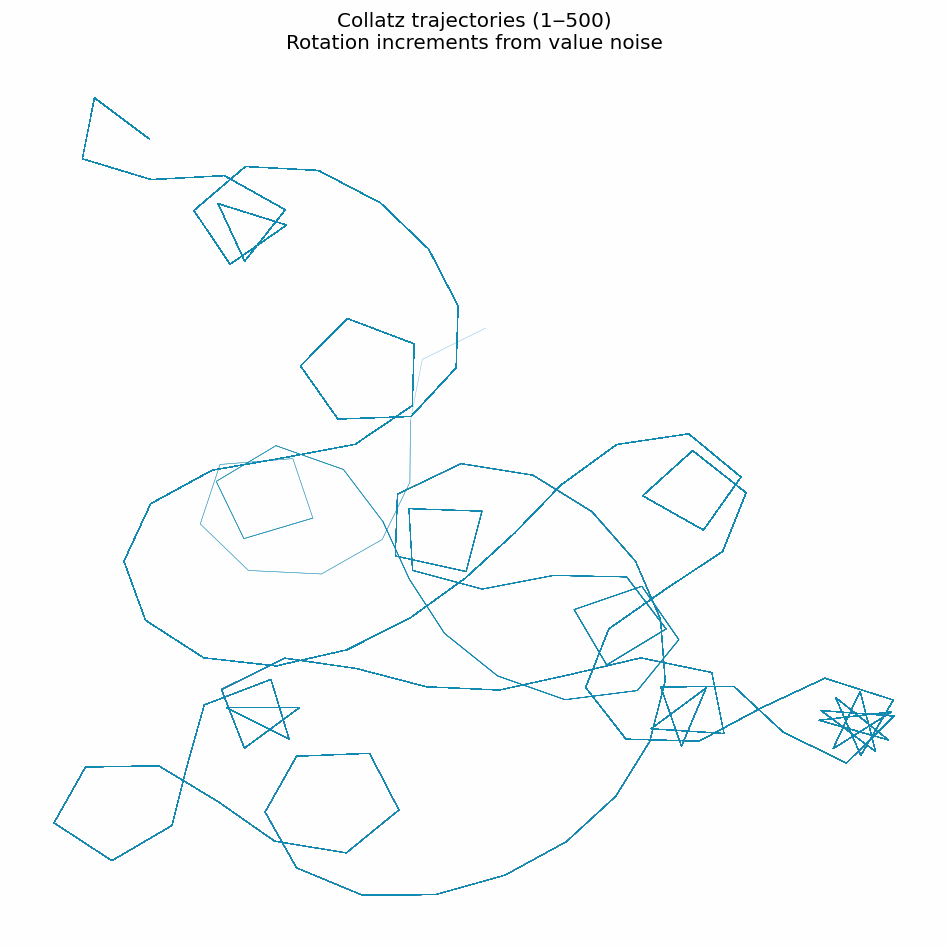

In [278]:
import numpy as np
import matplotlib.pyplot as plt
import math

# ---------- basic 1‑D value‑noise (smooth) -----------------------------
def value_noise(x, seed=0):
    """simple smooth pseudo‑Perlin‑like noise in [0,1] for float x"""
    np.random.seed(int(x) + seed * 131)
    left  = np.random.rand()
    np.random.seed(int(x)+1 + seed * 131)
    right = np.random.rand()
    t = x - int(x)
    # smoothstep interpolation
    t = t*t*(3 - 2*t)
    return (1-t)*left + t*right

def noise_angle(step, scale=0.1, seed=0):
    """map step index -> rotation angle via value noise"""
    return (value_noise(step * scale, seed) * 2*np.pi) - np.pi   # in (-π, π)

# ---------- Collatz sequence ------------------------------------------
def collatz_sequence(n):
    seq = [n]
    while n > 1:
        n = 3*n + 1 if n & 1 else n >> 1
        seq.append(n)
    return seq

# ---------- draw sequences --------------------------------------------
max_start = 500
step_len  = 0.4
plt.figure(figsize=(8,8), dpi=120, facecolor="#fefefe")
for start in range(1, max_start+1):
    x, y = 0.0, 0.0
    angle = 0.0
    xs, ys = [x], [y]
    for idx, val in enumerate(collatz_sequence(start)):
        angle += noise_angle(idx, scale=0.15, seed=42)   # cumulative rotation
        x += step_len * math.cos(angle)
        y += step_len * math.sin(angle)
        xs.append(x); ys.append(y)
    plt.plot(xs, ys, lw=0.3, alpha=0.5, color="#118ab2")

plt.axis("off")
plt.title("Collatz trajectories (1‒500)\nRotation increments from value noise")
plt.tight_layout()



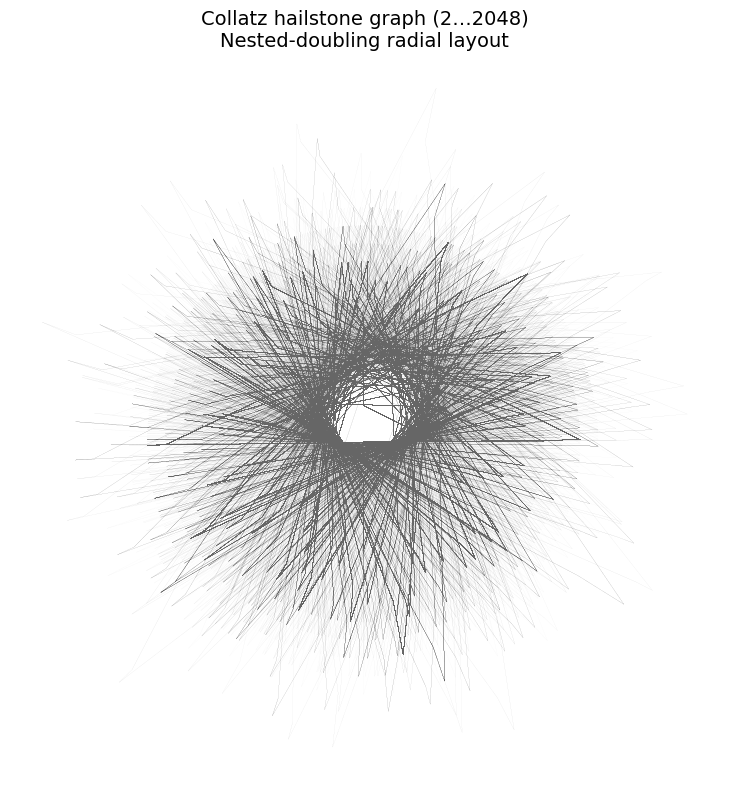

In [292]:
"""
Collatz ‘onion-donut’ visualization
-----------------------------------
Numbers are placed on doubling rings:
    r_n  = ⌊log₂ n⌋
    θ_n  = 2π (n − 2^{r_n}) / 2^{r_n}
    x_n  = r_n cos θ_n
    y_n  = r_n sin θ_n

Arrows follow the 3n+1 rule.

Change START / END or styling to taste.
"""

import math
import matplotlib.pyplot as plt

# ── 1 · Parameters ────────────────────────────────────────────────────
START, END = 2, 2048   # draw hailstone sequences for these starters
DRAW_ONLY_ODD_TO_EVEN = False      # set True to omit even→odd arrows
RING_GAP = 1.0                      # radial distance between rings
POINT_SIZE = 12                    # node marker size

# ── 2 · Collatz helpers ───────────────────────────────────────────────
def collatz_next(n: int) -> int:
    return 3 * n + 1 if n & 1 else n // 2

def hailstone(n: int):
    """Yield n, f(n), f(f(n)), …, 1"""
    while True:
        yield n
        if n == 1:
            break
        n = collatz_next(n)

# ── 3 · Coordinate map (nested doubling rings) ───────────────────────
def polar_coords(n: int):
    r = math.floor(math.log2(n))
    offset = n - 2**r
    theta = 2 * math.pi * offset / 2**r
    return r * RING_GAP, theta

def cartesian(n: int):
    r, theta = polar_coords(n)
    return r * math.cos(theta), r * math.sin(theta)

# Pre-compute coordinates for speed
coords = {n: cartesian(n) for n in range(1, END+1)}

# ── 4 · Build edge list for plotting ─────────────────────────────────
# ----- replace the segment-drawing loop with this --------------------
edges_x, edges_y = [], []

def get_xy(n: int):
    """Return cached (x,y) or compute if missing."""
    if n not in coords:
        coords[n] = cartesian(n)
    return coords[n]

for start in range(START, END + 1):
    seq = list(hailstone(start))
    for u, v in zip(seq[:-1], seq[1:]):
        if DRAW_ONLY_ODD_TO_EVEN and not (u & 1 and v % 2 == 0):
            continue
        xu, yu = get_xy(u)
        xv, yv = get_xy(v)
        edges_x.extend([xu, xv, None])
        edges_y.extend([yu, yv, None])

# ── 5 · Plot ─────────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(8, 8))
ax.plot(edges_x, edges_y, lw=0.01, color="black", alpha=0.6)

# optional node markers (make them tiny if many points)
xs, ys = zip(*(coords[n] for n in range(1, END+1)))
#ax.scatter(xs, ys, s=POINT_SIZE, color="#073b4c", alpha=0.8)

ax.set_aspect("equal")
ax.axis("off")
ax.set_title(f"Collatz hailstone graph ({START}…{END})\n"
             "Nested-doubling radial layout", fontsize=14)
plt.tight_layout()

# Vector PDF saves at infinite resolution
fig.savefig("collatz_onion.pdf", bbox_inches="tight")
plt.show()


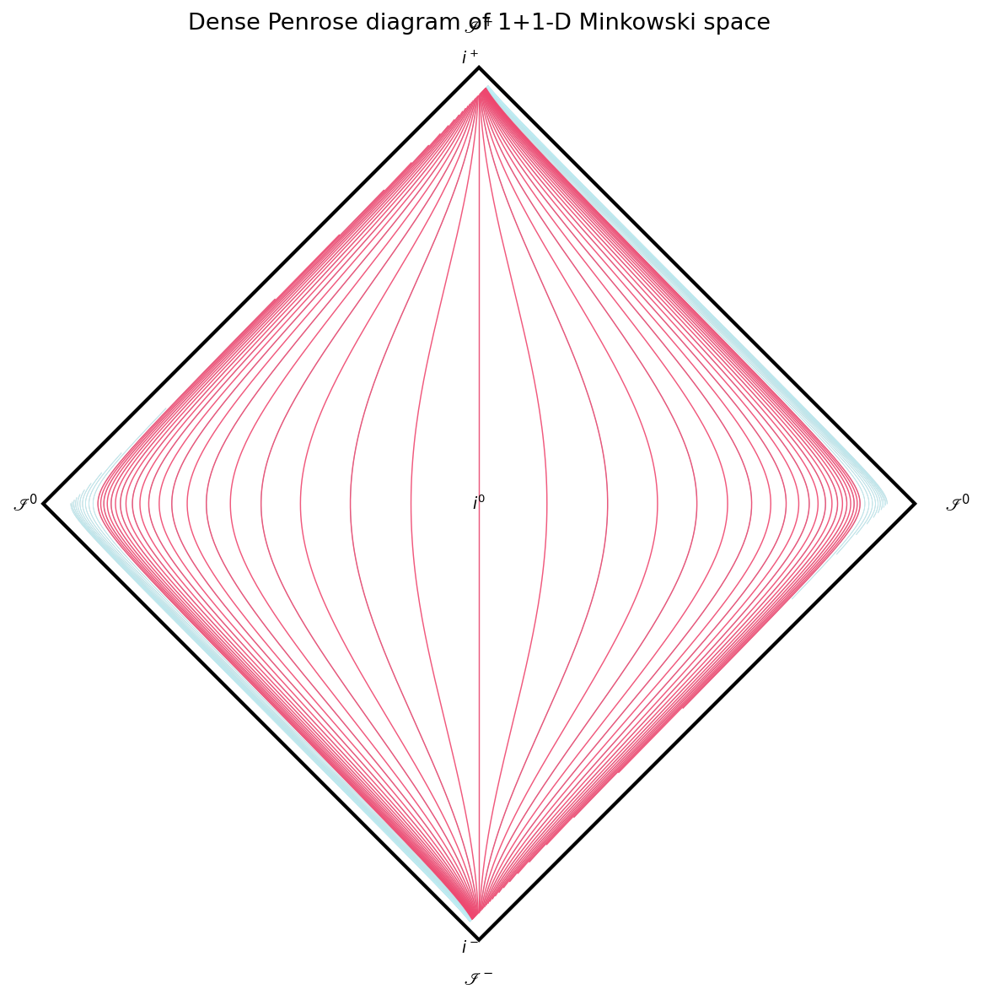

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import math

# ---------- conformal map helpers -------------------------------------
def minkowski_to_penrose(t, x):
    """(t,x) Minkowski → (T,X) compact coordinates."""
    u, v = t - x, t + x           # null coords
    U, V = np.arctan(u), np.arctan(v)
    T = 0.5 * (V + U)
    X = 0.5 * (V - U)
    return T, X

# ---------- parameters -------------------------------------------------
BOUNDARY   = math.pi / 2
RANGE      = 10            # how far in t,x we sample original space‐time
GRID_DENSITY = 41          # how many constant lines in each family
LINE_SAMPLES = 600         # resolution per curve

# ---------- precompute coordinate lists -------------------------------
ts = np.linspace(-RANGE, RANGE, GRID_DENSITY)   # constant-t stripes
xs = np.linspace(-RANGE, RANGE, GRID_DENSITY)   # constant-x stripes
uv   = np.linspace(-RANGE, RANGE, GRID_DENSITY) # null offsets

u_samples = np.linspace(-RANGE, RANGE, LINE_SAMPLES)

# ---------- plot setup -------------------------------------------------
fig, ax = plt.subplots(figsize=(8, 8), dpi=150)

# 1. boundary diamond
diamond = plt.Polygon(
    [[0,  BOUNDARY], [BOUNDARY, 0], [0, -BOUNDARY], [-BOUNDARY, 0]],
    fill=False, lw=2, color="black", zorder=5
)
ax.add_patch(diamond)

# 2. constant-t hyperbolae
for t0 in ts:
    v = u_samples + 2*t0
    T, X = minkowski_to_penrose(0.5*(v+u_samples), 0.5*(v-u_samples))
    ax.plot(X, T, lw=0.4, color="#98acae", alpha=0.8)

# 3. constant-x diagonals
for x0 in xs:
    u = u_samples
    v = u + 2*x0
    T, X = minkowski_to_penrose(0.5*(v+u), 0.5*(v-u))
    ax.plot(X, T, lw=0.4, color="#c2f7ff", alpha=0.8)

# 4. null geodesics (45°)
for shift in np.linspace(-RANGE, RANGE, GRID_DENSITY):
    u = u_samples
    v = u + shift
    T, X = minkowski_to_penrose(0.5*(v+u), 0.5*(v-u))
    ax.plot(X, T, lw=0.7, color="#ef476f", alpha=0.9)

# ---------- labels -----------------------------------------------------
off = 0.07*BOUNDARY
ax.text(0,  BOUNDARY+off,  r"$\mathscr{I}^+$", ha="center", va="bottom")
ax.text(0, -BOUNDARY-off,  r"$\mathscr{I}^-$", ha="center", va="top")
ax.text( BOUNDARY+off, 0,  r"$\mathscr{I}^0$",  va="center")
ax.text(-BOUNDARY-off, 0, r"$\mathscr{I}^0$",  va="center")
ax.text(0, 0, r"$i^0$", ha="center", va="center", fontsize=9)
ax.text(0,  BOUNDARY, r"$i^+$", ha="right", va="bottom", fontsize=9)
ax.text(0, -BOUNDARY, r"$i^-$", ha="right", va="top",    fontsize=9)

# ---------- aesthetics -------------------------------------------------
ax.set_xlim(-BOUNDARY-0.1, BOUNDARY+0.1)
ax.set_ylim(-BOUNDARY-0.1, BOUNDARY+0.1)
ax.set_aspect("equal")
ax.axis("off")
ax.set_title("Dense Penrose diagram of 1+1-D Minkowski space", fontsize=13)
fig.tight_layout()

# Vector PDF (infinite resolution) — uncomment to save
# fig.savefig("minkowski_penrose_dense.pdf", bbox_inches="tight")
plt.show()



In [ ]:
"""
Conformal Grid-Mapping  (black-background neon edition)
-------------------------------------------------------
• Draws the image of a square grid −XMAX…+XMAX under an analytic map  f(z).
• Function choices (set FUNC below):
      "poly12" : z ↦ z¹² + 0.2 z²
      "exp"    : z ↦ eᶻ
      "sin"    : z ↦ sin z
      "zeta"   : z ↦ ζ(z)      – requires  mpmath  (pip install mpmath)

The script is self-contained:  NumPy + Matplotlib are always available;
mpmath is imported lazily only when ζ is requested.

Result: a poster-ready figure on a black canvas.  Uncomment the last
line to save an infinite-resolution PDF.
"""

import numpy as np
import matplotlib.pyplot as plt

# ── 1 · choose the analytic map f(z) ───────────────────────────────────
FUNC = "poly12"          #  "poly12" | "exp" | "sin" | "zeta"

def f_poly12(z):     # z^12 + 0.2 z^2
    return 0.1* z**8

def f_exp(z):
    return np.exp(z)

def f_sin(z):
    return np.sin(z)

def f_zeta(z):
    try:
        import mpmath as mp
    except ImportError as e:
        raise ImportError("FUNC='zeta' needs mpmath – install via pip.") from e
    return np.vectorize(mp.zeta)(z)

F_DICT = {
    "poly12": f_poly12,
    "exp":    f_exp,
    "sin":    f_sin,
    "zeta":   f_zeta,
}
f = F_DICT[FUNC]

# ── 2 · grid parameters (tweak to taste) ──────────────────────────────
GRID_DENSITY = 500               # # of vertical + horizontal source lines
XMAX = 1.8 if FUNC == "zeta" else 3.0   # narrower window for ζ blow-ups
SAMPLES = 1200                  # points per line

x_vals = np.linspace(-XMAX, XMAX, GRID_DENSITY)
y_vals = np.linspace(-XMAX, XMAX, GRID_DENSITY)
t_line = np.linspace(-XMAX, XMAX, SAMPLES)

# ── helper: convert any iterable of complex-like to NumPy complex ------   
to_np = lambda arr: np.fromiter(map(complex, arr), dtype=np.complex128)

# ── 3 · plot setup (black background, neon palette) ───────────────────
fig, ax = plt.subplots(figsize=(7, 7), dpi=300,
                       facecolor="black")
ax.set_facecolor("black")
ax.axis("off")
ax.set_aspect("equal", adjustable="datalim")

COLOR_H = "pink"   # neon cyan   (horizontal source lines)
COLOR_V = "teal"   # bright pink (vertical   source lines)
LW_H, LW_V = 0.9, 1.1

# horizontal lines: y = const
for y0 in y_vals:
    z  = t_line + 1j*y0
    w  = to_np(f(z))
    ax.plot(w.real, w.imag, lw=LW_H, color=COLOR_H, alpha=0.8)

# vertical lines: x = const
for x0 in x_vals:
    z  = x0 + 1j*t_line
    w  = to_np(f(z))
    ax.plot(w.real, w.imag, lw=LW_V, color=COLOR_V, alpha=0.8)

plt.tight_layout(pad=0)

# save vector PDF  (comment out if you only want the on-screen plot)
# fig.savefig(f"conformal_{FUNC}.pdf", bbox_inches="tight", facecolor="black")

plt.show()


